# DC Crime prediction

In [41]:
# importing necessary libraries

# Plotting libraries/settings# Plott 
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

# Data manipulation libraries/settings
import numpy as np
import pandas as pd
import pandas_profiling
pd.options.display.max_rows=6
pd.options.display.max_columns=10

# Machine learning library/functions
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
np.random.seed(42)

from matplotlib import rcParams
rcParams.update({'figure.autolayout':True})

# setting visual

plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [42]:
# Print version info for the sake of reproducibility
import sys
import matplotlib as mpl
import sklearn as skl
print("python " + sys.version)
print("")
print("pandas " + str(pd.__version__))
print("numpy " + np.__version__)
print("matplotlib " + mpl.__version__)
print("seaborn " + sns.__version__)
print("sklearn" + skl.__version__)

python 3.6.13 |Anaconda, Inc.| (default, Mar 16 2021, 11:37:27) [MSC v.1916 64 bit (AMD64)]

pandas 1.1.5
numpy 1.19.2
matplotlib 3.3.4
seaborn 0.11.2
sklearn0.24.2


In [34]:
crime_df_21 = pd.read_csv('Crime_Incidents_in_2021 (1).csv')
crime_df_20 = pd.read_csv('Crime_Incidents_in_2020 (1).csv')
crime_df_19 = pd.read_csv('Crime_Incidents_in_2019 (1).csv')

crime_df_21 = crime_df_21.dropna(axis='columns', how='all')
crime_df_20 = crime_df_20.dropna(axis='columns', how='all')

#drop the null rows:
crime_df_21 = crime_df_21.dropna()
#drop the null rows:
crime_df_20 = crime_df_20.dropna()

frames = [crime_df_21,crime_df_20]
crime_df = pd.concat(frames)
crime_df = crime_df.drop(['BID','OBJECTID'],axis=1)
#crime_df = crime_df.dropna()
crime_df.head()

,X,Y,CCN,REPORT_DAT,SHIFT,...,VOTING_PRECINCT,LATITUDE,LONGITUDE,START_DATE,END_DATE
5,-77.034107,38.902522,15003190,2021/10/21 04:08:27+00,MIDNIGHT,...,Precinct 129,38.902514,-77.034105,2021/10/21 00:40:00+00,2021/10/21 02:00:00+00
8,-77.003516,38.907833,21051567,2021/04/23 15:48:59+00,DAY,...,Precinct 144,38.907825,-77.003514,2021/04/23 14:53:54+00,2021/04/23 14:55:59+00
9,-76.986776,38.879821,21051603,2021/04/23 16:08:48+00,DAY,...,Precinct 91,38.879813,-76.986774,2021/04/23 14:45:29+00,2021/04/23 15:15:55+00
16,-76.991796,38.862422,21054427,2021/04/29 06:39:37+00,MIDNIGHT,...,Precinct 119,38.862414,-76.991794,2021/04/29 05:47:06+00,2021/04/29 06:30:04+00
18,-77.042368,38.921631,21054542,2021/04/29 15:51:30+00,DAY,...,Precinct 24,38.921623,-77.042365,2021/04/28 23:15:28+00,2021/04/29 00:15:04+00


In [59]:
crime_df['REPORT_DAT'] = pd.to_datetime(crime_df['REPORT_DAT'].astype(str), errors='coerce')
crime_df['REPORT_DAT'] = pd.to_datetime(crime_df['REPORT_DAT'], format = '%d/%m/%Y %H:%M:%S')

column_1 = crime_df['REPORT_DAT']
db=pd.DataFrame({"year": column_1.dt.year,
              "month": column_1.dt.month,
              "day": column_1.dt.day,
#               "dayofyear": column_1.dt.dayofyear,
#               "week": column_1.dt.week,
               "weekofyear": column_1.dt.weekofyear,
              "dayofweek": column_1.dt.dayofweek,
              "quarter": column_1.dt.quarter,
                 "hour": column_1.dt.hour,
                 "minute": column_1.dt.minute,
                 "second":column_1.dt.second,
                })

C:\Users\dhinton\Anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  # Remove the CWD from sys.path while we load stuff.


In [60]:
dataset1=crime_df.drop('REPORT_DAT',axis=1)
data1=pd.concat([db,dataset1],axis=1)
data1

,year,month,day,weekofyear,dayofweek,...,VOTING_PRECINCT,LATITUDE,LONGITUDE,START_DATE,END_DATE
5,2021,10,21,42,3,...,Precinct 129,38.902514,-77.034105,2021/10/21 00:40:00+00,2021/10/21 02:00:00+00
8,2021,4,23,16,4,...,Precinct 144,38.907825,-77.003514,2021/04/23 14:53:54+00,2021/04/23 14:55:59+00
9,2021,4,23,16,4,...,Precinct 91,38.879813,-76.986774,2021/04/23 14:45:29+00,2021/04/23 15:15:55+00
...,...,...,...,...,...,...,...,...,...,...,...
27899,2020,2,13,7,3,...,Precinct 129,38.901478,-77.023986,2020/02/12 20:46:58+00,2020/02/12 20:47:34+00
27907,2020,2,17,8,0,...,Precinct 114,38.864380,-76.990009,2020/02/17 15:30:33+00,2020/02/17 15:35:02+00
27909,2020,2,17,8,0,...,Precinct 129,38.900868,-77.020910,2020/02/17 17:00:54+00,2020/02/17 18:00:19+00


In [35]:
print("-----------------")
print("Training Data Set")
print("-----------------")
crime_df.info()

-----------------
Training Data Set
-----------------
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8869 entries, 5 to 27909
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   X                     8869 non-null   float64
 1   Y                     8869 non-null   float64
 2   CCN                   8869 non-null   int64  
 3   REPORT_DAT            8869 non-null   object 
 4   SHIFT                 8869 non-null   object 
 5   METHOD                8869 non-null   object 
 6   OFFENSE               8869 non-null   object 
 7   BLOCK                 8869 non-null   object 
 8   XBLOCK                8869 non-null   float64
 9   YBLOCK                8869 non-null   float64
 10  WARD                  8869 non-null   int64  
 11  ANC                   8869 non-null   object 
 12  DISTRICT              8869 non-null   float64
 13  PSA                   8869 non-null   float64
 14  NEIGHBORHOOD_CLUS

In [36]:
crime_df.head(2)

,X,Y,CCN,REPORT_DAT,SHIFT,...,VOTING_PRECINCT,LATITUDE,LONGITUDE,START_DATE,END_DATE
5,-77.034107,38.902522,15003190,2021/10/21 04:08:27+00,MIDNIGHT,...,Precinct 129,38.902514,-77.034105,2021/10/21 00:40:00+00,2021/10/21 02:00:00+00
8,-77.003516,38.907833,21051567,2021/04/23 15:48:59+00,DAY,...,Precinct 144,38.907825,-77.003514,2021/04/23 14:53:54+00,2021/04/23 14:55:59+00


In [37]:
crime_df.describe()

,X,Y,CCN,XBLOCK,YBLOCK,...,DISTRICT,PSA,CENSUS_TRACT,LATITUDE,LONGITUDE
count,8869.000000,8869.000000,8.869000e+03,8869.000000,8869.000000,...,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000
mean,-77.023118,38.897498,2.062046e+07,397994.975566,136627.134569,...,2.129665,217.875296,9373.881836,38.897490,-77.023116
std,0.020722,0.013364,5.584451e+05,1797.339871,1483.814783,...,1.474979,146.652426,48509.134139,0.013364,0.020722
...,...,...,...,...,...,...,...,...,...,...,...
50%,-77.021919,38.901331,2.100796e+07,398098.850000,137052.350000,...,2.000000,206.000000,7100.000000,38.901323,-77.021917
75%,-77.005887,38.905609,2.111193e+07,399489.560000,137528.970000,...,2.000000,209.000000,10202.000000,38.905601,-77.005885
max,-76.978092,38.928180,2.173580e+07,401901.490000,140033.110000,...,7.000000,703.000000,980000.000000,38.928172,-76.978090


In [38]:
crime_df.isnull().sum()/len(crime_df)

X             0.0
Y             0.0
CCN           0.0
             ... 
LONGITUDE     0.0
START_DATE    0.0
END_DATE      0.0
Length: 22, dtype: float64

In [39]:
pandas_profiling.ProfileReport(crime_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [45]:
for item in crime_df:
    print (item)
    print (crime_df[item].nunique())

X
896
Y
896
CCN
8867
REPORT_DAT
8866
SHIFT
3
METHOD
3
OFFENSE
9
BLOCK
892
XBLOCK
883
YBLOCK
879
WARD
5
ANC
14
DISTRICT
6
PSA
22
NEIGHBORHOOD_CLUSTER
17
BLOCK_GROUP
119
CENSUS_TRACT
56
VOTING_PRECINCT
32
LATITUDE
896
LONGITUDE
896
START_DATE
8762
END_DATE
8789


In [49]:
crime_df.groupby('VOTING_PRECINCT').OFFENSE.value_counts(normalize=True)

VOTING_PRECINCT  OFFENSE                   
Precinct 1       THEFT/OTHER                   0.442276
                 THEFT F/AUTO                  0.265041
                 MOTOR VEHICLE THEFT           0.152846
                                                 ...   
Precinct 91      ASSAULT W/DANGEROUS WEAPON    0.014925
                 HOMICIDE                      0.003731
                 SEX ABUSE                     0.003731
Name: OFFENSE, Length: 201, dtype: float64

In [52]:
crime_df.groupby('PSA').OFFENSE.value_counts()

PSA    OFFENSE                   
101.0  THEFT/OTHER                   423
       THEFT F/AUTO                  289
       MOTOR VEHICLE THEFT           126
                                    ... 
703.0  ASSAULT W/DANGEROUS WEAPON      8
       HOMICIDE                        6
       BURGLARY                        4
Name: OFFENSE, Length: 139, dtype: int64

In [53]:
crime_df.describe()

,X,Y,CCN,XBLOCK,YBLOCK,...,DISTRICT,PSA,CENSUS_TRACT,LATITUDE,LONGITUDE
count,8869.000000,8869.000000,8.869000e+03,8869.000000,8869.000000,...,8869.000000,8869.000000,8869.000000,8869.000000,8869.000000
mean,-77.023118,38.897498,2.062046e+07,397994.975566,136627.134569,...,2.129665,217.875296,9373.881836,38.897490,-77.023116
std,0.020722,0.013364,5.584451e+05,1797.339871,1483.814783,...,1.474979,146.652426,48509.134139,0.013364,0.020722
...,...,...,...,...,...,...,...,...,...,...,...
50%,-77.021919,38.901331,2.100796e+07,398098.850000,137052.350000,...,2.000000,206.000000,7100.000000,38.901323,-77.021917
75%,-77.005887,38.905609,2.111193e+07,399489.560000,137528.970000,...,2.000000,209.000000,10202.000000,38.905601,-77.005885
max,-76.978092,38.928180,2.173580e+07,401901.490000,140033.110000,...,7.000000,703.000000,980000.000000,38.928172,-76.978090


In [54]:
crime_df.corr()

,X,Y,CCN,XBLOCK,YBLOCK,...,DISTRICT,PSA,CENSUS_TRACT,LATITUDE,LONGITUDE
X,1.000000,-0.636402,0.021732,1.000000,-0.636629,...,0.136971,0.131490,0.044030,-0.636402,1.000000
Y,-0.636402,1.000000,-0.014168,-0.636344,1.000000,...,0.147397,0.147198,-0.037236,1.000000,-0.636402
CCN,0.021732,-0.014168,1.000000,0.021733,-0.014172,...,0.001498,0.001198,0.008059,-0.014168,0.021732
...,...,...,...,...,...,...,...,...,...,...,...
CENSUS_TRACT,0.044030,-0.037236,0.008059,0.044020,-0.037253,...,-0.014761,-0.014980,1.000000,-0.037236,0.044030
LATITUDE,-0.636402,1.000000,-0.014168,-0.636344,1.000000,...,0.147397,0.147198,-0.037236,1.000000,-0.636402
LONGITUDE,1.000000,-0.636402,0.021732,1.000000,-0.636629,...,0.136971,0.131490,0.044030,-0.636402,1.000000


<AxesSubplot:xlabel='DISTRICT', ylabel='count'>

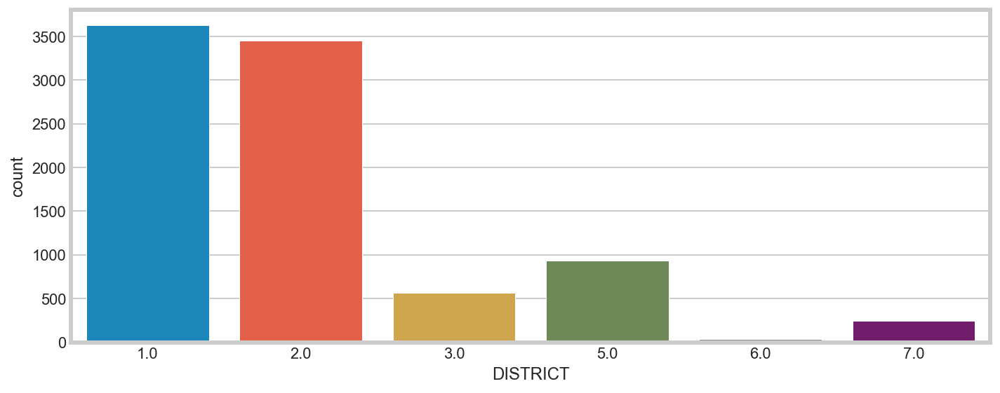

In [61]:
fig,ax =plt.subplots(figsize=(10, 4))
sns.countplot(x='DISTRICT', data=data1, ax=ax)

<AxesSubplot:xlabel='SHIFT', ylabel='count'>

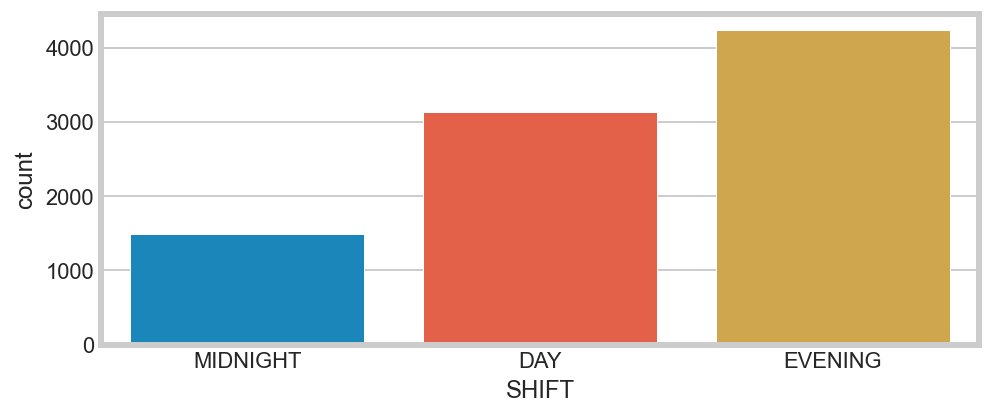

In [62]:
fig, ax = plt.subplots(figsize=(7, 3))
sns.countplot(x='SHIFT', data=data1, ax=ax)

<AxesSubplot:xlabel='NEIGHBORHOOD_CLUSTER', ylabel='count'>

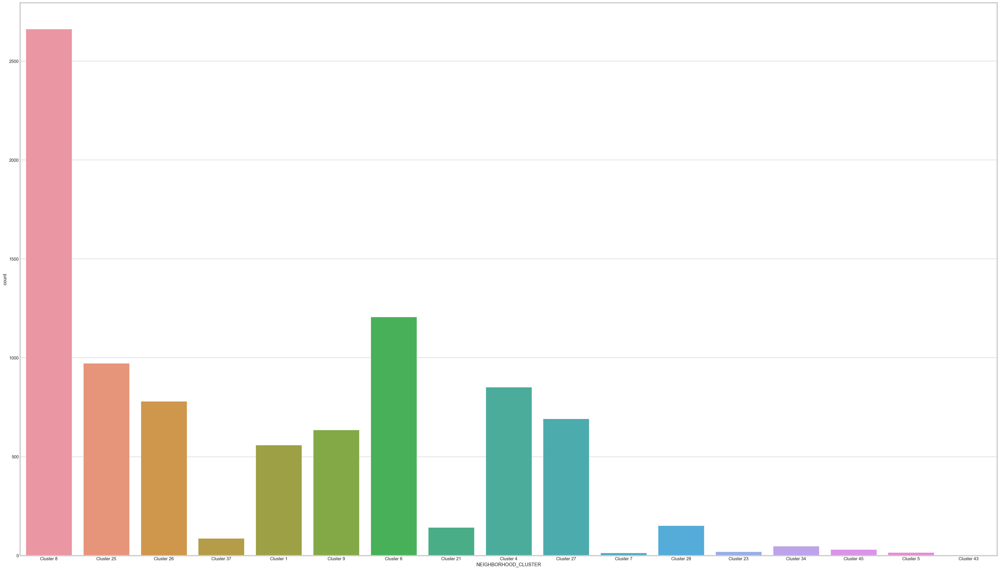

In [63]:
fig, ax = plt.subplots(figsize=(35, 20))
sns.countplot(x='NEIGHBORHOOD_CLUSTER', data=data1, ax=ax)

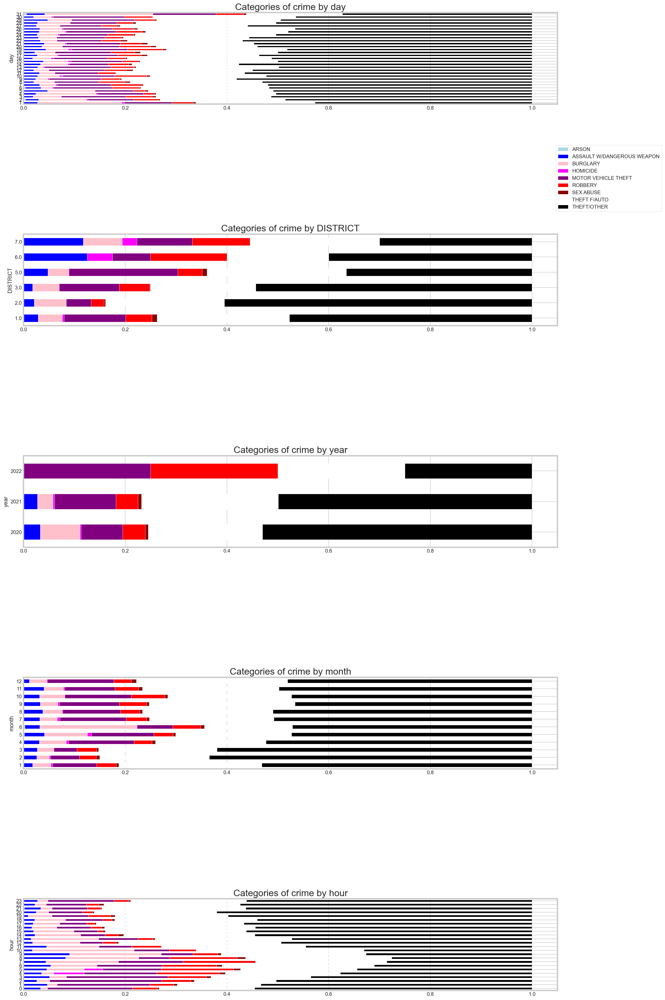

In [65]:
def proportionCrimeCategory(data1, discreteParam):
    """
    Extracts proportion of Crimes in the data for the various values of discreteParam
    :param data: input dataframe
    :param discreteParam: name of column of dataframe 
    :return normedtable: Series
            column 1 : index of month
            column 2 : sum of crimes during this month/total numbers of crimes
    """
    by_param = data1.groupby([discreteParam, 'OFFENSE'])
    #apllying .size() allows to extract number of instances for each Crime type by the offense in each discreteParam
    table = by_param.size()
    #puts it as a 2D table with number of occurences per discreteParam and Crimetype
    d2table = table.unstack()
    #d2table.sum(1) returns the number of crimes in all crimetypes per discreteParam
    #1 is for the number of the axe on which the sum is done. Here :Crimetype
    normedtable = d2table.div(d2table.sum(1), axis=0)
    return normedtable
    print(normedtable)
    
discreteParamList = ['day', 'DISTRICT', 'year','month','hour']
fig1, axes1 = plt.subplots(len(discreteParamList),1) #creates a 3x1 blank plot
for i in range(len(discreteParamList)): #now we fill in the subplots
    param = discreteParamList[i]
    table = proportionCrimeCategory(data1, param)

    ax = axes1[i]
    #create plot title
    ax.set_title("Categories of crime by %s" % discreteParamList[i])
    ax.title.set_fontsize(20)
    #choose colormap (memo : looks ok : none, prism_r)
    #stacked = true, allows to stack the different categories into one bar
    table.plot(kind='barh', stacked=True, ax=axes1[i],figsize=(20,30), color=['lightblue','blue','pink','magenta', 'purple', 'red', 'darkred', 'white', 'black','turquoise'])

    #Puts legend only on second graph and pushes the legend out of plot
    if i==1:
        #how to move legends : http://matplotlib.org/examples/pylab_examples/legend_demo3.html
        ax.legend(bbox_to_anchor=(1.2, 2))

    else:
        ax.legend_.remove()
plt.savefig("proportions.pdf",format="pdf")